## Import Libraries

In [103]:
#import thu vien
from pyspark.sql import SparkSession
from pyspark import SparkConf
from pyspark.sql.functions import col, year, count, desc, asc, sum, min as spark_min, max as spark_max, datediff, to_date,collect_list,avg
from pyspark.sql import functions as F
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
import plotly.express as px
from wordcloud import WordCloud

In [104]:
conf = SparkConf()
#set config
conf = conf.setAppName("ml_sparkSession") \
           .setMaster('local') \
           .set("spark.executor.memory", "4g") \
           .set("spark.executor.cores", "2") \
           .set("spark.sql.shuffle.partitions", "4") \
           .set("spark.executor.instances", "2") 
#create Spark Session
spark = SparkSession.builder.config(conf = conf).getOrCreate()

In [102]:
#read data
artist_data = spark.read.parquet("hdfs://namenode:9000/datalake/silver_data/silver_artist")
album_data = spark.read.parquet("hdfs://namenode:9000/datalake/silver_data/silver_album")
track_data = spark.read.parquet("hdfs://namenode:9000/datalake/silver_data/silver_track")
track_feature_data = spark.read.parquet("hdfs://namenode:9000/datalake/silver_data/silver_track_feature")

## Data overview

### 1. Show data.


#### a. Show table.

In [3]:
# Artist
print('Data of Artist')
artist_data.show()

Data of Artist
+--------------------+-------------------+--------------------+---------+----------+--------------------+--------------------+
|                  id|               name|              genres|followers|popularity|          link_image|                 url|
+--------------------+-------------------+--------------------+---------+----------+--------------------+--------------------+
|001Ju8fxqMbobN0xj...|        Samar Singh|        bhojpuri pop|   558163|        62|https://i.scdn.co...|https://open.spot...|
|001KkBGwhLqBrFXyh...|            Nyquest|                null|     3915|        45|https://i.scdn.co...|https://open.spot...|
|007e8cQJN6Rkx7Fbp...|       ឆន សុវណ្ណរាជ|       cambodian pop|     3439|        22|https://i.scdn.co...|https://open.spot...|
|00AFbqxvdDK6T1D6M...|               GLAY|       classic j-pop|   590825|        56|https://i.scdn.co...|https://open.spot...|
|00AFbqxvdDK6T1D6M...|               GLAY|               j-pop|   590825|        56|https://i.sc

In [4]:
# Album
print('Data of Album')
album_data.show()


Data of Album
+--------------------+--------------------+--------------------+--------------------+-----+--------------------+----------+------------+----------------------+------------+--------------------+--------------------+--------------------+
|              artist|           artist_id|                  id|                name| type|               label|popularity|release_date|release_date_precision|total_tracks|          copyrights|                 url|          link_image|
+--------------------+--------------------+--------------------+--------------------+-----+--------------------+----------+------------+----------------------+------------+--------------------+--------------------+--------------------+
|          Sonu Nigam|1dVygo6tRFXC8CSWU...|000LYwpRfBAlh4aFM...|Sonu Nigam Kannad...|album|        Lahari Music|        25|  2017-07-30|                   day|           7|2017 Lahari Recor...|https://open.spot...|https://i.scdn.co...|
|              AmaLee|4sf4DrAOkheqktxTy...

In [5]:
# Track
print('Data of Track')
track_data.show()

Data of Track
+--------------------+--------------------+--------------------+--------------------+------------+-----------+-----------+--------+--------------------+-----------+--------------------+
|            album_id|          album_name|                  id|                name|track_number|disc_number|duration_ms|explicit|                 url|restriction|             preview|
+--------------------+--------------------+--------------------+--------------------+------------+-----------+-----------+--------+--------------------+-----------+--------------------+
|1BD29pKydSXe1EsHF...|Colin Frake On Fi...|0006Rv1e2Xfh6Qooy...|           Nightwood|           4|          1|     189638|   False|https://open.spot...|       None|https://p.scdn.co...|
|32RJzqlapfiU0fr2l...|             E.D.G.E|0007AYhg2UQbEm88m...|Mandarin Oranges ...|          10|          1|     198000|   False|https://open.spot...|       None|https://p.scdn.co...|
|2bzYq3sEUgarG5TZA...|      Un peu de nous|000NfL9hLeDwI

In [6]:
# Track Feature
print('Data of Track Feature')
track_feature_data.show()

Data of Track Feature
+--------------------+------------+------+---+--------+----+-----------+------------+----------------+--------+-------+-------+--------------+
|                  id|danceability|energy|key|loudness|mode|speechiness|acousticness|instrumentalness|liveness|valence|  tempo|time_signature|
+--------------------+------------+------+---+--------+----+-----------+------------+----------------+--------+-------+-------+--------------+
|4Ck7wmbpzBTsV2ZW1...|       0.884| 0.568|  4|  -8.149|   0|        0.4|       0.183|             0.0|   0.121|  0.445|142.975|             4|
|3oD1BMuoUVmRlT7TB...|        0.73| 0.608|  2|  -5.887|   1|        0.4|       0.177|             0.0|   0.115|  0.448|141.774|             4|
|21s6yO134T8yIRm49...|       0.739| 0.699|  1|  -7.309|   1|     0.0427|       0.103|             0.0|  0.0911|  0.404|133.995|             4|
|6zSLrRCjeVfbApM20...|       0.685| 0.756|  8|  -6.415|   1|      0.243|       0.427|             0.0|   0.226|  0.517|1

#### b. Display schemas of each table.

In [7]:
print('Schema of Artist')
artist_data.printSchema()

Schema of Artist
root
 |-- id: string (nullable = true)
 |-- name: string (nullable = true)
 |-- genres: string (nullable = true)
 |-- followers: integer (nullable = true)
 |-- popularity: integer (nullable = true)
 |-- link_image: string (nullable = true)
 |-- url: string (nullable = true)



In [8]:
print('Schema of Album')
album_data.printSchema()

Schema of Album
root
 |-- artist: string (nullable = true)
 |-- artist_id: string (nullable = true)
 |-- id: string (nullable = true)
 |-- name: string (nullable = true)
 |-- type: string (nullable = true)
 |-- label: string (nullable = true)
 |-- popularity: integer (nullable = true)
 |-- release_date: date (nullable = true)
 |-- release_date_precision: string (nullable = true)
 |-- total_tracks: integer (nullable = true)
 |-- copyrights: string (nullable = true)
 |-- url: string (nullable = true)
 |-- link_image: string (nullable = true)



In [9]:
print('Schema of Track')
track_data.printSchema()

Schema of Track
root
 |-- album_id: string (nullable = true)
 |-- album_name: string (nullable = true)
 |-- id: string (nullable = true)
 |-- name: string (nullable = true)
 |-- track_number: integer (nullable = true)
 |-- disc_number: integer (nullable = true)
 |-- duration_ms: integer (nullable = true)
 |-- explicit: string (nullable = true)
 |-- url: string (nullable = true)
 |-- restriction: string (nullable = true)
 |-- preview: string (nullable = true)



In [10]:
print('Schema of Track Feature')
track_feature_data.printSchema()

Schema of Track Feature
root
 |-- id: string (nullable = true)
 |-- danceability: float (nullable = true)
 |-- energy: float (nullable = true)
 |-- key: integer (nullable = true)
 |-- loudness: float (nullable = true)
 |-- mode: integer (nullable = true)
 |-- speechiness: float (nullable = true)
 |-- acousticness: float (nullable = true)
 |-- instrumentalness: float (nullable = true)
 |-- liveness: float (nullable = true)
 |-- valence: float (nullable = true)
 |-- tempo: float (nullable = true)
 |-- time_signature: integer (nullable = true)



### 2. Check data.

#### Count the number of missing values in each column of the data tables.

In [105]:
def show_missing_value(df):
    missing_value_count={col:df.filter(df[col].isNull()).count() for col in df.columns}
    for col,count in missing_value_count.items():
        print(f"Column '{col}': {count} missing values")

In [106]:
print('Missing value in Artist Data:')
show_missing_value(artist_data)

Missing value in Artist Data:
Column 'id': 0 missing values
Column 'name': 0 missing values
Column 'genres': 3737 missing values
Column 'followers': 0 missing values
Column 'popularity': 0 missing values
Column 'link_image': 372 missing values
Column 'url': 0 missing values


In [107]:
print('Missing value in Album Data:')
show_missing_value(album_data)

Missing value in Album Data:
Column 'artist': 0 missing values
Column 'artist_id': 0 missing values
Column 'id': 0 missing values
Column 'name': 0 missing values
Column 'type': 0 missing values
Column 'label': 2 missing values
Column 'popularity': 0 missing values
Column 'release_date': 3457 missing values
Column 'release_date_precision': 0 missing values
Column 'total_tracks': 0 missing values
Column 'copyrights': 0 missing values
Column 'url': 0 missing values
Column 'link_image': 6 missing values


In [108]:
print('Missing value in Track Data: ')
show_missing_value(track_data)

Missing value in Track Data: 
Column 'album_id': 0 missing values
Column 'album_name': 7 missing values
Column 'id': 0 missing values
Column 'name': 22 missing values
Column 'track_number': 0 missing values
Column 'disc_number': 0 missing values
Column 'duration_ms': 0 missing values
Column 'explicit': 0 missing values
Column 'url': 0 missing values
Column 'restriction': 0 missing values
Column 'preview': 194814 missing values


In [109]:
print('Missing value in Track Feature Data: ')
show_missing_value(track_feature_data)

Missing value in Track Feature Data: 
Column 'id': 0 missing values
Column 'danceability': 3671 missing values
Column 'energy': 3671 missing values
Column 'key': 3671 missing values
Column 'loudness': 3671 missing values
Column 'mode': 3671 missing values
Column 'speechiness': 3671 missing values
Column 'acousticness': 3671 missing values
Column 'instrumentalness': 3671 missing values
Column 'liveness': 3671 missing values
Column 'valence': 3671 missing values
Column 'tempo': 3671 missing values
Column 'time_signature': 3671 missing values


#### Drop null values.

In [110]:
track_feature_data=track_feature_data.na.drop()

#### Basic statistics.

In [111]:
features_describe=track_feature_data.drop('id').describe().toPandas().T
features_describe

,0,1,2,3,4
summary,count,mean,stddev,min,max
danceability,980780,0.541443692075078,0.2012381652350059,0.0,0.991
energy,980780,0.5523816451341205,0.2757874589643376,0.0,1.0
key,980780,5.212366687738331,3.5705180333292548,0,11
loudness,980780,-10.824771157884834,7.200923215860888,-60.0,3.215
mode,980780,0.6393085095536206,0.4802013892922179,0,1
speechiness,980780,0.0989352855581191,0.1338495323229806,0.0,0.972
acousticness,980780,0.4155798012551731,0.3494840702832439,0.0,0.996
instrumentalness,980780,0.2012250181768447,0.35450066555175735,0.0,1.0
liveness,980780,0.23535274235308035,0.22511974629831144,0.0,1.0


### 3. EDA (Exploratory Data Analysis).

#### a. EDA Artist.

Finding 10 most popular in the spotify dataset.


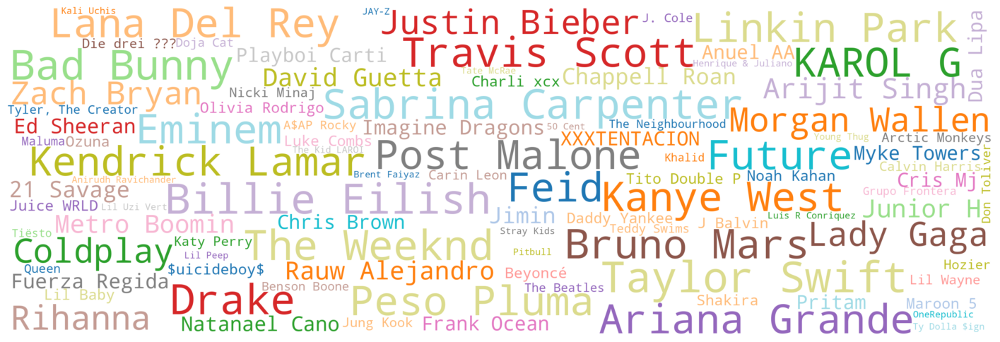

In [18]:
most_popular_artist=artist_data.select('name','popularity').distinct()
most_popular_artist=most_popular_artist.orderBy(col('popularity').desc()).limit(100).toPandas()
word_freq={row['name']:row['popularity']for index,row in most_popular_artist.iterrows()}
wc = WordCloud(max_font_size=130, min_font_size=25, colormap='tab20', background_color='white', 
                   prefer_horizontal=.95, width=3000, height=1000, random_state=0).generate_from_frequencies(word_freq)    
plt.figure(figsize=(18,14))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.show()

Finding 10 most followers artist in the spotify dataset

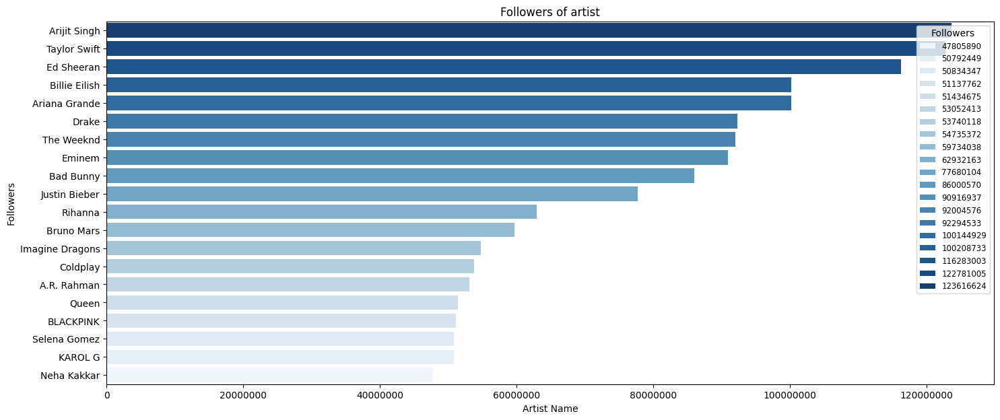

In [19]:
most_followers_artist=artist_data.select('name','followers').distinct()
most_followers_artist=most_followers_artist.orderBy(col('followers').desc()).limit(20).toPandas()
plt.figure(figsize=(17,7))
colors = sns.color_palette("Blues", len(most_followers_artist)) 
sns.barplot(most_followers_artist, x='followers', y='name',palette=colors,hue='followers')
plt.xlabel("Artist Name")
plt.ylabel("Followers")
plt.title("Followers of artist")
plt.ticklabel_format(axis='x', style='plain') 
plt.legend(title='Followers', fontsize='small', title_fontsize='medium', loc='upper right')
plt.show()

Finding 5 most popular genres in the spotify dataset

<function matplotlib.pyplot.show(close=None, block=None)>

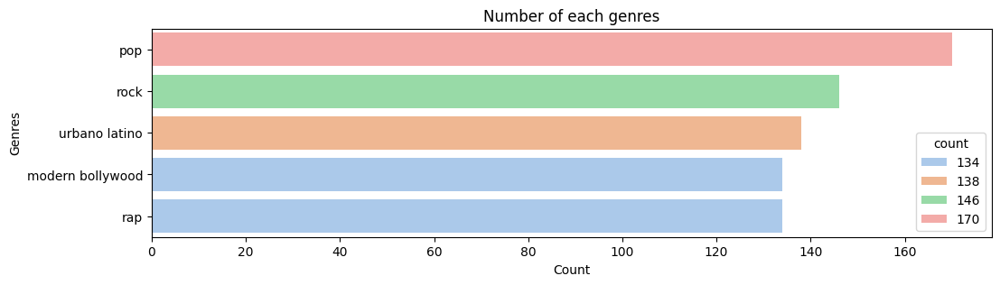

In [20]:
most_popular_genres=artist_data.filter(col("genres").isNotNull()).groupBy("genres").count().orderBy(col("count").desc()).limit(5).toPandas()
plt.figure(figsize=(12,3))
sns.barplot(most_popular_genres,x='count',y='genres',palette='pastel',hue='count')
plt.xlabel("Count")
plt.ylabel("Genres")
plt.title("Number of each genres")
plt.ticklabel_format(axis='x', style='plain') 
plt.show

#### EDA Album

Finding 10 most popular album in the spotify dataset.

In [112]:
b=album_data.select('name','popularity').distinct()
most_popular_album=b.orderBy(col("popularity").desc()).limit(10).toPandas()
most_popular_album

,name,popularity
0,Short n' Sweet,100
1,HIT ME HARD AND SOFT,99
2,INCÓMODO,95
3,The Rise and Fall of a Midwest Princess,95
4,Un Verano Sin Ti,93
5,THE TORTURED POETS DEPARTMENT: THE ANTHOLOGY,93
6,ÉXODO,93
7,Lover,92
8,UTOPIA,92
9,SOUR,92


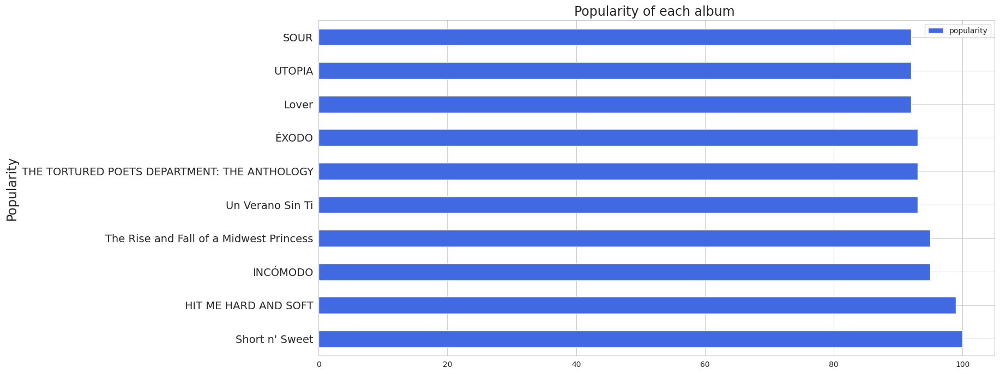

In [113]:
most_popular_album.plot.barh("name","popularity",color="royalblue",figsize=(16,8))
plt.ylabel("Popularity",fontsize=17)
plt.title("Popularity of each album ",fontsize=17)
plt.yticks(fontsize=14)
plt.show()

Count the number of albums released in 20th century 

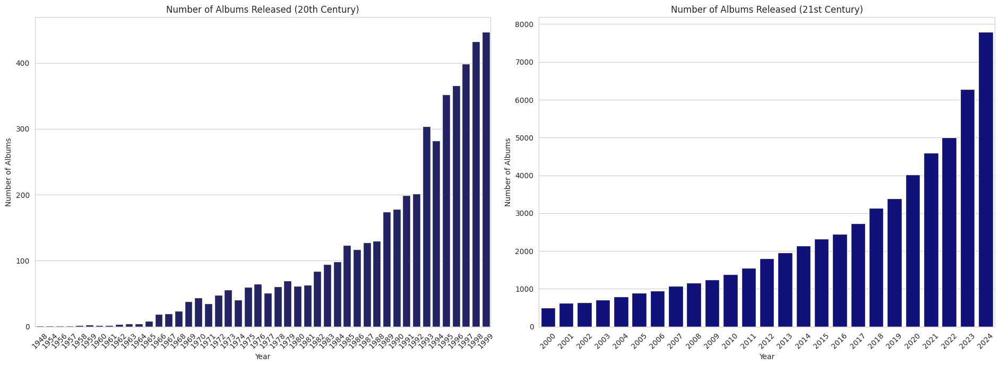

In [114]:
albums_per_year=album_data.where(album_data["release_date"].isNotNull()).groupBy(year("release_date").alias("year")).agg(count("id").alias("The number of albums")).orderBy(desc("year"))
albums_20th=albums_per_year.filter(albums_per_year['year'] < 2000).toPandas()
albums_21th=albums_per_year.filter(albums_per_year['year'] >= 2000).toPandas()

figure,axes=plt.subplots(1,2,figsize=(19,7))
plt.subplots_adjust(hspace=0.6, wspace=0.6) 

sns.barplot
sns.barplot(x='year', y='The number of albums', data=albums_20th, ax=axes[0], color="midnightblue")
axes[0].set_title('Number of Albums Released (20th Century)')
axes[0].set_xlabel('Year')
axes[0].set_ylabel('Number of Albums')
axes[0].tick_params(axis='x', rotation=45)

sns.barplot(x='year', y='The number of albums', data=albums_21th, ax=axes[1], color="darkblue")
axes[1].set_title('Number of Albums Released (21st Century)')
axes[1].set_xlabel('Year')
axes[1].set_ylabel('Number of Albums')
axes[1].tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()

Identify how many albums lack a release date.

In [115]:
null_year_count=album_data.where(album_data["release_date"].isNull()).count()
print("The number of albums without a release year:",null_year_count)

The number of albums without a release year: 3457


The album with the most tracks in album.

In [119]:
top_album_per_artist=album_data.select("name","total_tracks").filter(col("name").isNotNull())
top_album_per_artist=top_album_per_artist.orderBy(col("total_tracks").desc()).limit(10).toPandas()
top_album_per_artist

,name,total_tracks
0,Abbado: Mozart,430
1,Weapons Foley Sound Effects,397
2,"The Super Single, Vol. 2",379
3,"Wacky Robots & Gizmo Sound Effects, Vol. 2",331
4,Al-Quran Al-Karim (The Holy Koran),310
5,Karajan A-Z: Verdi - Vivaldi,304
6,Al-Quran Al-Karim (The Holy Koran),281
7,Calendar Girl – Ersehnt (Calendar Girl Quartal...,279
8,Abbado: Verdi,278
9,Al-Quran Al-Karim (The Holy Koran),264


Artist activity over years.

In [120]:
longevity = album_data.groupBy('artist').agg(spark_min('release_date').alias('first_release'),spark_max('release_date').alias('last_release')).withColumn('first_release_year', year(col('first_release'))).withColumn('last_release_year', year(col('last_release'))).withColumn('longevity',datediff(col('last_release'),col('first_release'))/365)
longevity = longevity.orderBy(col('longevity').desc()).limit(30)
top_artists = longevity.select('artist').rdd.flatMap(lambda x: x).collect()
artist_albums = album_data.filter(col('artist').isin(top_artists))
artist_years = artist_albums.withColumn('release_year', year(col('release_date')))
df = artist_years.groupBy('artist').agg(collect_list('release_year').alias('years')).toPandas()

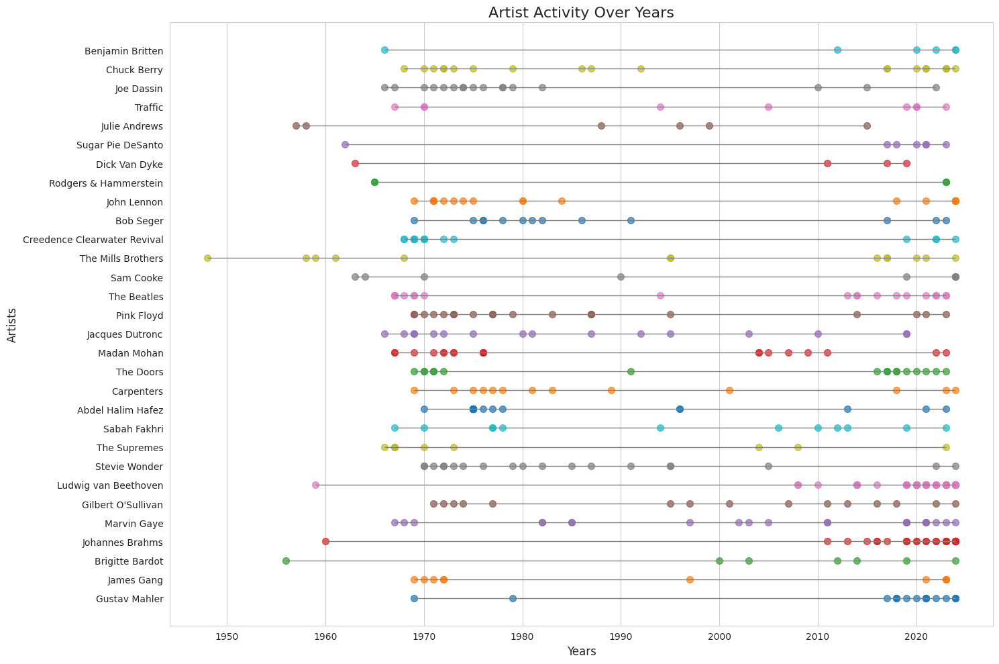

In [121]:
plt.figure(figsize=(15, 10))
sns.set_style("whitegrid")
for index, row in df.iterrows():
    artist = row['artist']
    years = sorted(row['years'])  
    plt.hlines(y=index, xmin=min(years), xmax=max(years), color="gray", linewidth=1)  
    plt.scatter(years, [index] * len(years), label=artist, s=50, alpha=0.7)  
plt.yticks(range(len(df)), df['artist'], fontsize=10)
plt.xlabel('Years', fontsize=12)
plt.ylabel('Artists', fontsize=12)
plt.title('Artist Activity Over Years', fontsize=16)
plt.grid(axis='y', linestyle='', alpha=0.7)
plt.legend([], frameon=False) 
plt.tight_layout()
plt.show()

#### EDA Track.

Joining artist, album, track tables.

In [122]:
artist=artist_data.withColumnRenamed('id', 'artist_id').withColumnRenamed('name', 'artist_name')
artist_data_new=artist.drop('link_image','url','followers')
album= album_data.withColumnRenamed('id', 'album_id').withColumnRenamed('name', 'album_name')
album_data_new=album.drop('artist','type', 'copyrights','url','link_image','popularity','release_date','label','release_date_precision','total_tracks')
artirt_album_data=artist_data_new.join(album_data_new, on='artist_id', how='inner').distinct()

Tree map of top 100 singers with their playlist.

In [139]:
artist=artist_data.withColumnRenamed('id', 'artist_id').withColumnRenamed('name', 'artist_name')
artist_data_new=artist.drop('link_image','url','followers','genres')

top_100_artist=artist_data_new.select('artist_id','artist_name','popularity').distinct()
top_100_artist=top_100_artist.orderBy(col('popularity').desc()).limit(100)

album= album_data.withColumnRenamed('id', 'album_id').withColumnRenamed('name', 'album_name')
album_data_new=album.drop('artist','type', 'copyrights','url','link_image','popularity','release_date','label','release_date_precision','total_tracks')

artist_album_data=top_100_artist.join(album_data_new, on='artist_id', how='inner').distinct()
track=track_data.withColumnRenamed('id','track_id').withColumnRenamed('name','track_name')
track_data_new=track.drop('explicit', 'url','restriction','preview','album_name','track_number','disc_number','duration_ms')
artist_album_track_data=artist_album_data.join(track_data_new,on='album_id',how="inner").distinct()
artist_album_track_data=artist_album_track_data.toPandas()

fig = px.treemap(artist_album_track_data, path=[px.Constant('Singer'), 'artist_name', 'album_name', 'track_name'], custom_data=['popularity'])
fig.update_traces(root_color='lightgreen', hovertemplate='<b>%{label}</b><br>Popularity: %{customdata[0]}<extra></extra>')
fig.update_layout(title='<b>TreeMap of Singers Playlist</b>', title_x=0.5)
fig.show()

Average song duration over the years.

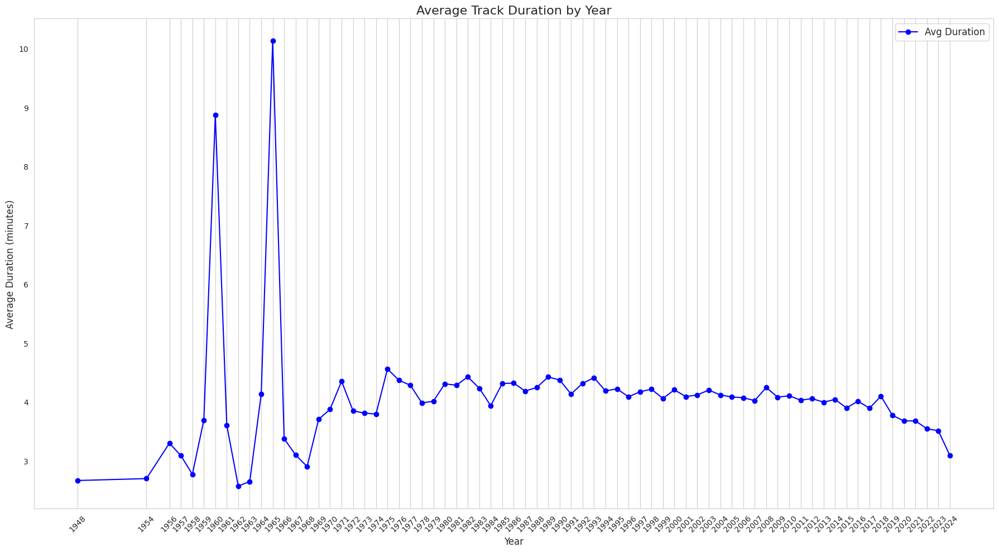

In [133]:
album_and_track=album.join(track,on='album_id',how="inner")
average_duration_by_year=album_and_track.withColumn("year", year(col("release_date"))).groupBy("year").agg(avg("duration_ms").alias("avg_duration")).orderBy("year").toPandas()
average_duration_by_year=average_duration_by_year[average_duration_by_year["year"].notna()]
average_duration_by_year["year"]=average_duration_by_year["year"].astype(int)
average_duration_by_year["avg_duration_minutes"]=average_duration_by_year["avg_duration"]/60000
plt.figure(figsize=(18, 10))
plt.plot(average_duration_by_year["year"],average_duration_by_year["avg_duration_minutes"],marker="o",linestyle="-",color="blue",label="Avg Duration")
plt.title("Average Track Duration by Year", fontsize=16)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Average Duration (minutes)", fontsize=12)
plt.grid(axis="y", linestyle=" ", alpha=0.7)
plt.xticks(average_duration_by_year["year"], rotation=45)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

#### EDA Track Feature.


Distribution of Spotify Audio Features.

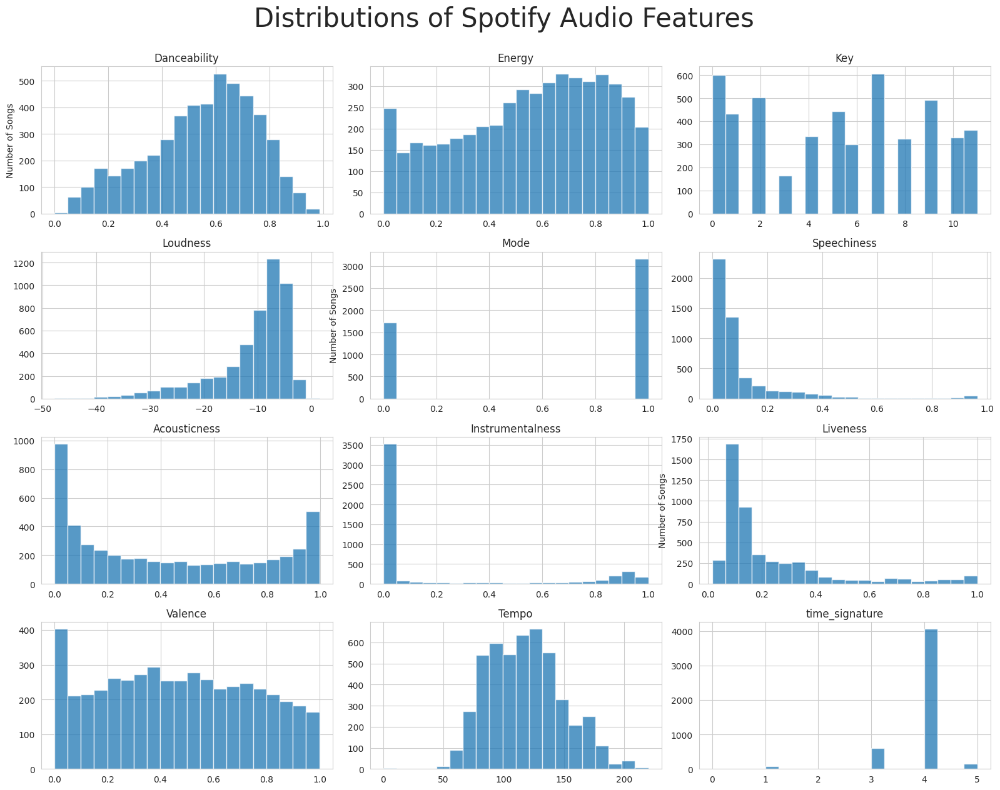

In [134]:
sampled_track_feature = track_feature_data.sample(withReplacement=False, fraction=0.005, seed=42)
sampled_track_feature_pandas = sampled_track_feature.toPandas()
axes = sampled_track_feature_pandas.drop(['id'], axis=1).hist(figsize=(16,12), bins=20, alpha=0.75)
axes = axes.ravel()
plt.tight_layout()
titles = ['Danceability','Energy','Key', 'Loudness','Mode','Speechiness','Acousticness','Instrumentalness','Liveness', 'Valence','Tempo', 'Time Signature']
for i in range(len(axes)-1):
    axes[i].set_title(titles[i])
    if i % 4 == 0:
        axes[i].set_ylabel('Number of Songs')
plt.suptitle('Distributions of Spotify Audio Features', fontsize=30, y=1.05)
plt.show()

Correlation heatmap.

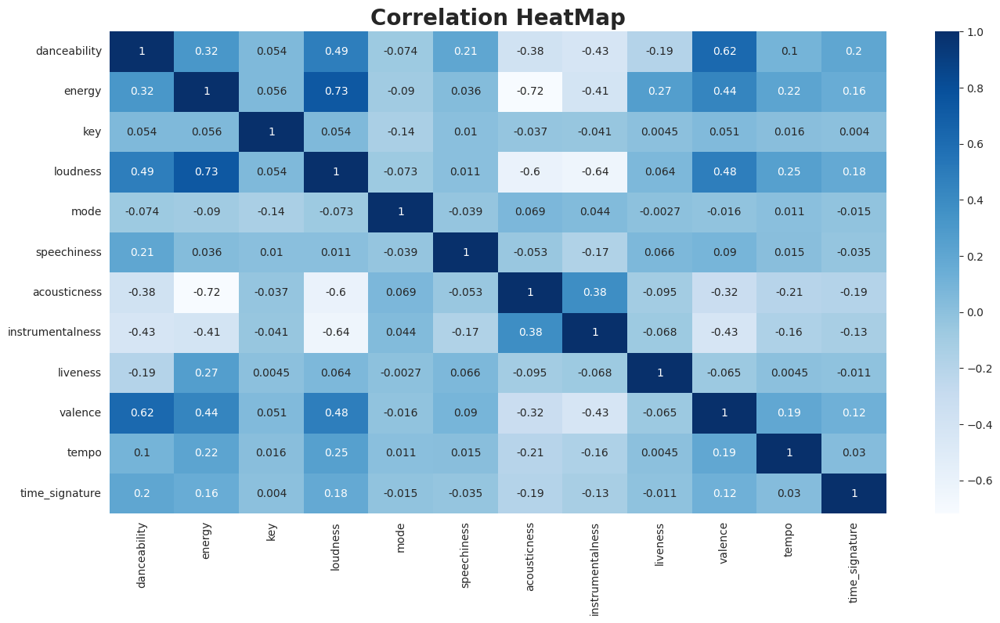

In [135]:
columns = ['danceability','energy','key', 'loudness','mode','speechiness','acousticness','instrumentalness','liveness', 'valence','tempo', 'time_signature']
df_scatter = sampled_track_feature_pandas[columns]
corr_matrix = df_scatter.corr()
plt.figure(figsize=(16, 8))
color=sns.color_palette("Blues", as_cmap=True)
hmap=sns.heatmap(corr_matrix, cmap=color, annot=True)
hmap.set_title('Correlation HeatMap',fontsize=20, fontweight="bold")
plt.show()


Distributions of Spotify Audio Features.

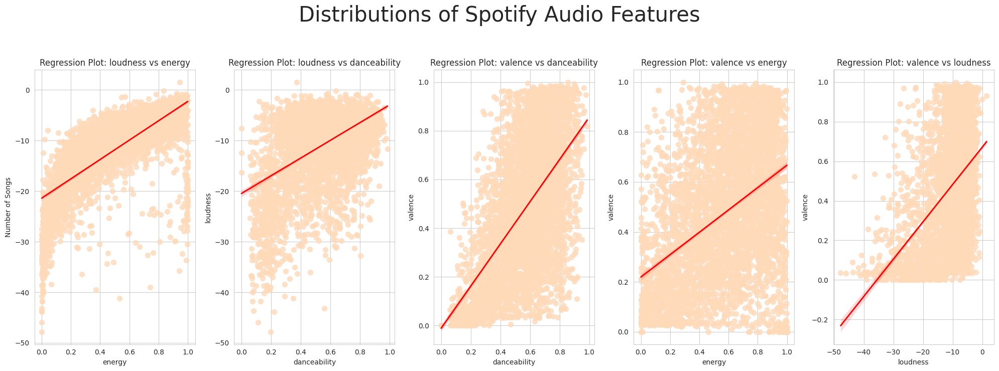

In [136]:
def create_regression_plots(data, feature_pairs, line_color='red', scatter_color='peachpuff'):
    num_plots = len(feature_pairs)
    rows = (num_plots // 5) + (1 if num_plots % 5 != 0 else 0)  
    fig, axes = plt.subplots(rows, 5, figsize=(20, 7* rows))
    axes = axes.flatten()

    for i, (x_col, y_col) in enumerate(feature_pairs):
        sns.regplot(data=data, x=x_col, y=y_col,
                    line_kws={'color': line_color, 'linewidth': 2}, 
                    scatter_kws={'color': scatter_color, 's': 50}, ax=axes[i])
        axes[i].set_title(f'Regression Plot: {y_col} vs {x_col}')
        if i % 5== 0:
            axes[i].set_ylabel('Number of Songs')

    plt.suptitle('Distributions of Spotify Audio Features', fontsize=30, y=1.05)
    plt.tight_layout()
    plt.show()

feature_pairs = [
    ('energy', 'loudness'),
    ('danceability', 'loudness'),
    ('danceability', 'valence'),
    ('energy', 'valence'),
    ('loudness', 'valence')
]

create_regression_plots(sampled_track_feature_pandas, feature_pairs)


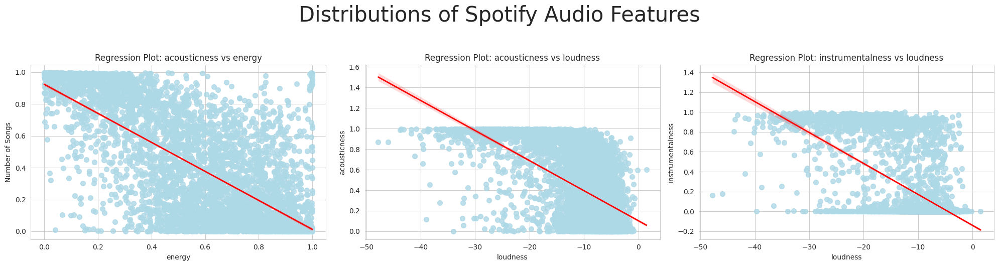

In [137]:
def create_regression_plots(data, feature_pairs, line_color='red', scatter_color='lightblue'):
    num_plots = len(feature_pairs)
    rows = (num_plots // 3) + (1 if num_plots % 3 != 0 else 0)  
    fig, axes = plt.subplots(rows, 3, figsize=(20, 5* rows))
    axes = axes.flatten()

    for i, (x_col, y_col) in enumerate(feature_pairs):
        sns.regplot(data=data, x=x_col, y=y_col,
                    line_kws={'color': line_color, 'linewidth': 2}, 
                    scatter_kws={'color': scatter_color, 's': 50}, ax=axes[i])
        axes[i].set_title(f'Regression Plot: {y_col} vs {x_col}')
        if i % 3 == 0:
            axes[i].set_ylabel('Number of Songs')

    plt.suptitle('Distributions of Spotify Audio Features', fontsize=30, y=1.05)
    plt.tight_layout()
    plt.show()

feature_pairs = [
    ('energy', 'acousticness'),
    ('loudness', 'acousticness'),
    ('loudness', 'instrumentalness')
]

create_regression_plots(sampled_track_feature_pandas, feature_pairs)


Joining table.

In [138]:
track_feature_data=track_feature_data.withColumnRenamed('id','track_id')
album_and_tracks=album_and_track.select('track_id',year(col('release_date')),'duration_ms')
album_track_feature=album_and_tracks.join(track_feature_data,on='track_id',how="inner")
sampled_album_track_feature = album_track_feature.sample(withReplacement=False, fraction=0.005, seed=42)
sampled_album_track_feature_pandas = sampled_album_track_feature.toPandas()

Boxplot for Each Feature.

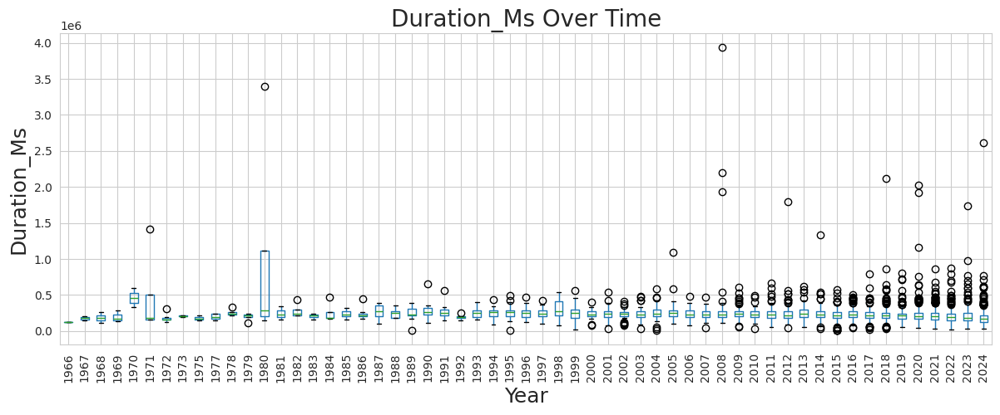

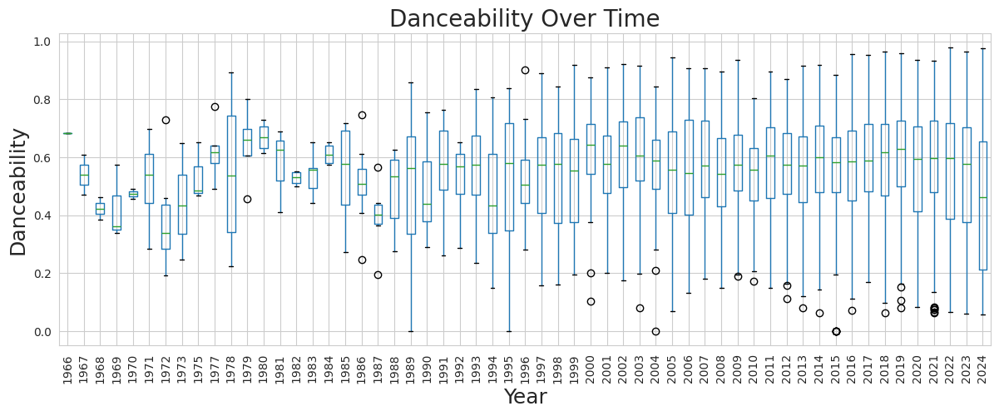

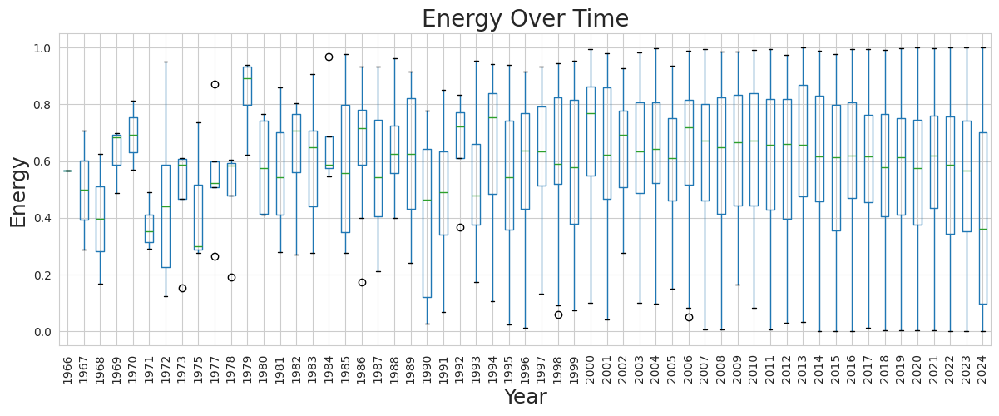

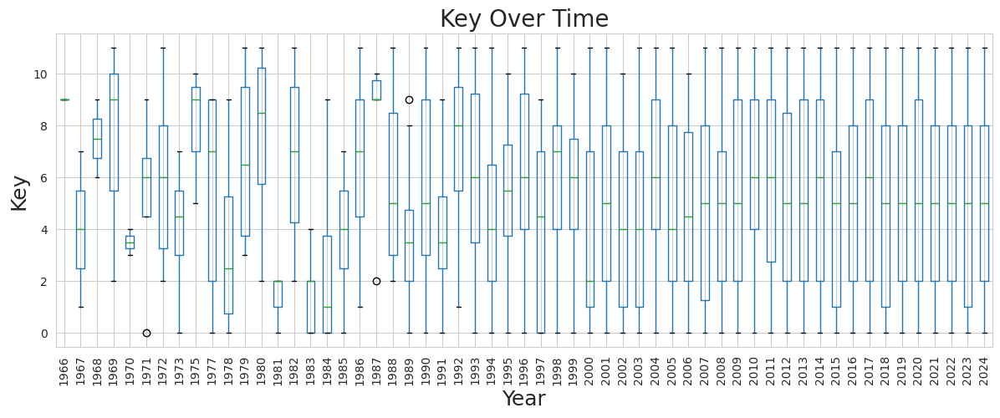

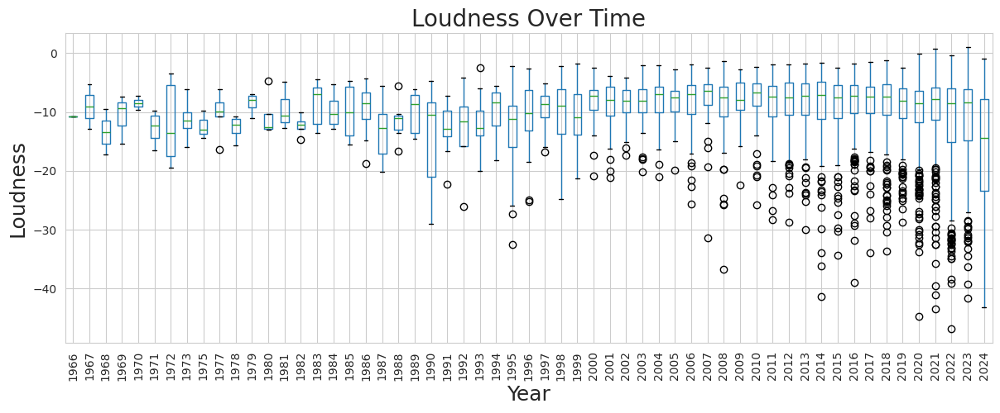

...

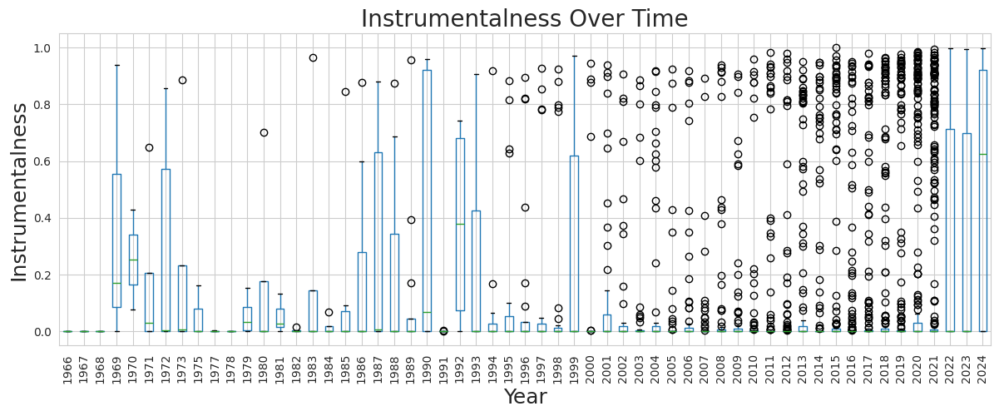

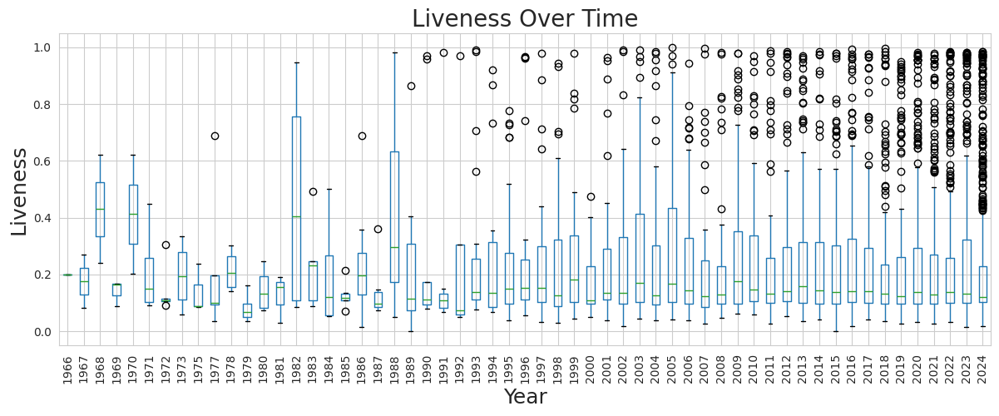

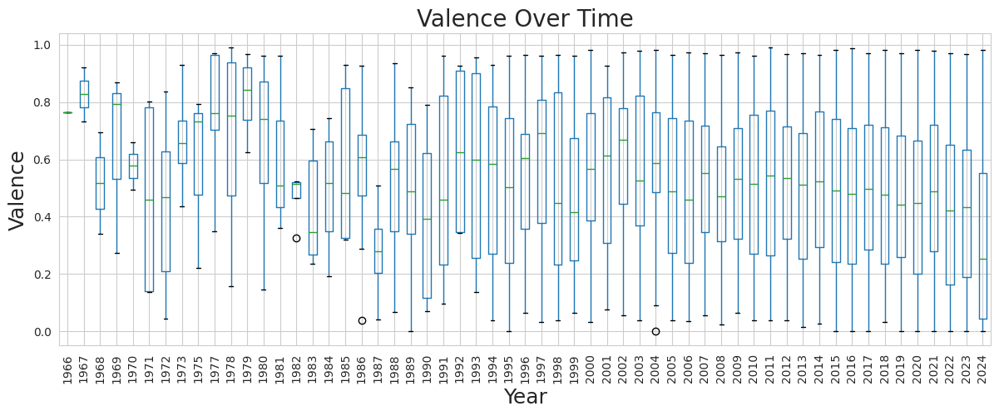

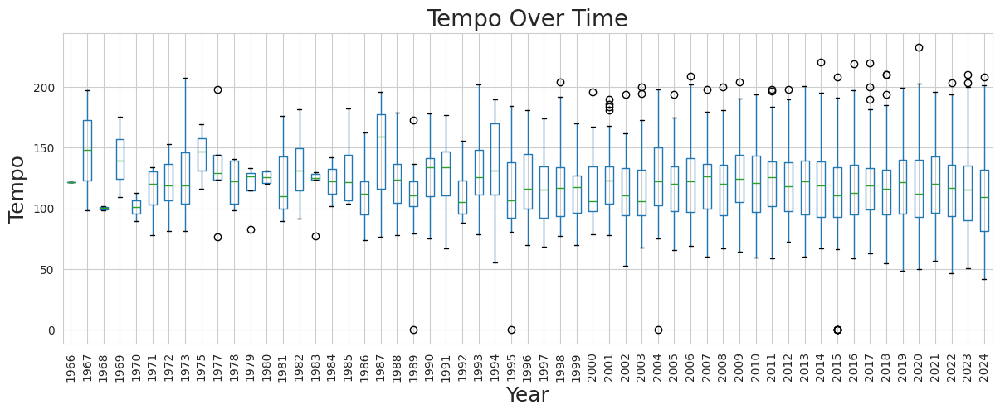

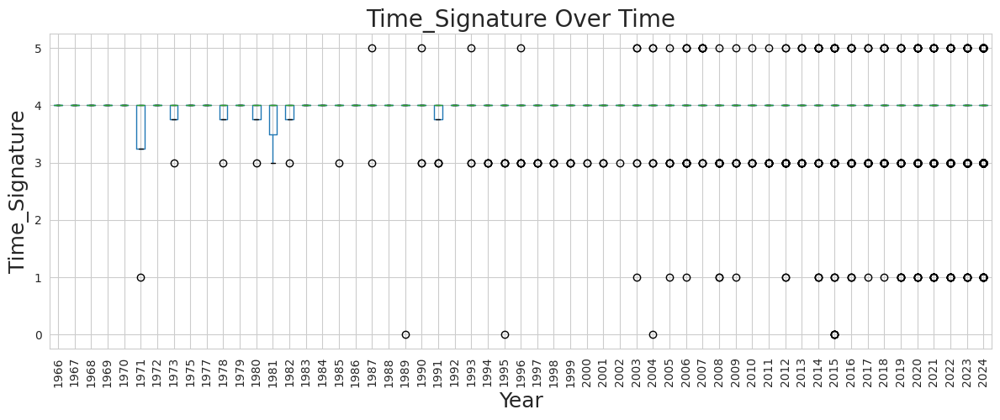

In [100]:
track_feature_data=track_feature_data.withColumnRenamed('id','track_id')
album_and_tracks=album_and_track.select('track_id',year(col('release_date')).alias('year'),'duration_ms')
album_track_feature=album_and_tracks.join(track_feature_data,on='track_id',how="inner")
sampled_album_track_feature = album_track_feature.sample(withReplacement=False, fraction=0.005, seed=42)
sampled_album_track_feature_pandas = sampled_album_track_feature.toPandas()
sampled_album_track_feature_pandas.dropna(inplace=True)
sampled_album_track_feature_pandas['year'] = sampled_album_track_feature_pandas['year'].astype(int)
audio_features = ['duration_ms', 'danceability', 'energy','key','loudness','mode', 'speechiness','acousticness', 'instrumentalness','liveness', 'valence','tempo','time_signature']
for audio_feature in audio_features:
    ax = sampled_album_track_feature_pandas[['year', audio_feature]].boxplot(by='year', rot = 90,figsize=(14,5))
    ax.yaxis.grid(True)
    ax.set_xlabel('year', fontsize=18)
    ax.set_ylabel(audio_feature, fontsize=18)
    title = audio_feature.title() + ' Over Time'
    ax.set(ylabel=audio_feature.title())
    ax.set(xlabel='Year')
    ax.set_title(title, fontsize=20)
    plt.suptitle('')